# Real Waste DataSet
### Inspection of the dataset given by the RealWaste. Main purpose of this is to identify the key features and get a good idea on the dataset.

In [1]:
# Data manipulation and analysis
import numpy as np
import pandas as pd
from pathlib import Path
import os
from collections import Counter

# Image processing
from PIL import Image
import cv2

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

# Utilities
import warnings
warnings.filterwarnings('ignore')

# Set visualization style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 10

print("✅ All libraries imported successfully!")

✅ All libraries imported successfully!


In [2]:
DATASET_PATH = "/kaggle/input/realwaste-dataset/RealWaste"

# Verify path exists
if not os.path.exists(DATASET_PATH):
    print(f"❌ ERROR: Path does not exist: {DATASET_PATH}")
    print("Please update DATASET_PATH with the correct location")
else:
    print(f"✅ Dataset path verified: {DATASET_PATH}")

✅ Dataset path verified: /kaggle/input/realwaste-dataset/RealWaste


In [3]:
# Initialize storage for image metadata
image_data = []
class_names = []

print("Loading dataset information...")
print("-" * 80)

# Traverse through class directories
dataset_path = Path(DATASET_PATH)

for class_dir in sorted(dataset_path.iterdir()):
    if class_dir.is_dir():
        class_name = class_dir.name
        class_names.append(class_name)
        
        image_count = 0
        
        for img_path in class_dir.glob('*'):
            if img_path.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp', '.tiff']:
                try:
                    # Open image and extract metadata
                    img = Image.open(img_path)
                    img_array = np.array(img)
                    
                    # Store metadata
                    image_data.append({
                        'path': str(img_path),
                        'filename': img_path.name,
                        'class': class_name,
                        'width': img.width,
                        'height': img.height,
                        'aspect_ratio': img.width / img.height,
                        'mode': img.mode,
                        'file_size_kb': img_path.stat().st_size / 1024,
                        'num_channels': len(img.getbands()),
                        'mean_intensity': img_array.mean(),
                        'std_intensity': img_array.std(),
                        'min_intensity': img_array.min(),
                        'max_intensity': img_array.max()
                    })
                    
                    image_count += 1
                    
                except Exception as e:
                    print(f"  ⚠️  Error loading {img_path.name}: {e}")
        
        print(f"  ✓ {class_name}: {image_count} images")

# Create DataFrame
df = pd.DataFrame(image_data)

print("-" * 80)
print(f"\n✅ Successfully loaded {len(df)} images from {len(class_names)} classes")
print(f"\n📁 Classes found: {', '.join(class_names)}")

Loading dataset information...
--------------------------------------------------------------------------------
  ✓ Cardboard: 461 images
  ✓ Food Organics: 411 images
  ✓ Glass: 420 images
  ✓ Metal: 790 images
  ✓ Miscellaneous Trash: 495 images
  ✓ Paper: 500 images
  ✓ Plastic: 921 images
  ✓ Textile Trash: 318 images
  ✓ Vegetation: 436 images
--------------------------------------------------------------------------------

✅ Successfully loaded 4752 images from 9 classes

📁 Classes found: Cardboard, Food Organics, Glass, Metal, Miscellaneous Trash, Paper, Plastic, Textile Trash, Vegetation


In [4]:
print("=" * 80)
print("DATASET OVERVIEW")
print("=" * 80)

print(f"\n📊 Basic Statistics:")
print(f"  • Total Images: {len(df):,}")
print(f"  • Number of Classes: {len(class_names)}")
print(f"  • Average images per class: {len(df) / len(class_names):.0f}")

print(f"\n📸 Image Properties:")
print(f"  • Width range: {df['width'].min()} - {df['width'].max()} pixels")
print(f"  • Height range: {df['height'].min()} - {df['height'].max()} pixels")
print(f"  • File size range: {df['file_size_kb'].min():.1f} - {df['file_size_kb'].max():.1f} KB")

print(f"\n🎨 Color Modes:")
mode_counts = df['mode'].value_counts()
for mode, count in mode_counts.items():
    print(f"  • {mode}: {count:,} images ({count/len(df)*100:.1f}%)")

# Display first few rows
print(f"\n📋 Sample Data:")
display(df.head())

DATASET OVERVIEW

📊 Basic Statistics:
  • Total Images: 4,752
  • Number of Classes: 9
  • Average images per class: 528

📸 Image Properties:
  • Width range: 524 - 524 pixels
  • Height range: 524 - 524 pixels
  • File size range: 47.7 - 242.8 KB

🎨 Color Modes:
  • RGB: 4,752 images (100.0%)

📋 Sample Data:


,path,filename,class,width,height,aspect_ratio,mode,file_size_kb,num_channels,mean_intensity,std_intensity,min_intensity,max_intensity
0,/kaggle/input/realwaste-dataset/RealWaste/Card...,Cardboard_255.jpg,Cardboard,524,524,1.0,RGB,76.887695,3,151.918652,35.188840,0,255
1,/kaggle/input/realwaste-dataset/RealWaste/Card...,Cardboard_70.jpg,Cardboard,524,524,1.0,RGB,175.825195,3,156.889496,36.116972,0,255
2,/kaggle/input/realwaste-dataset/RealWaste/Card...,Cardboard_78.jpg,Cardboard,524,524,1.0,RGB,89.124023,3,150.982932,46.072758,0,255
3,/kaggle/input/realwaste-dataset/RealWaste/Card...,Cardboard_130.jpg,Cardboard,524,524,1.0,RGB,154.881836,3,150.832908,47.036451,0,255
4,/kaggle/input/realwaste-dataset/RealWaste/Card...,Cardboard_418.jpg,Cardboard,524,524,1.0,RGB,77.466797,3,173.608995,32.120797,15,242


In [5]:
print("=" * 80)
print("DETAILED STATISTICS")
print("=" * 80)

print("\n📊 Numerical Features Summary:")
display(df.describe())

print("\n📋 DataFrame Info:")
df.info()

print("\n🔍 Missing Values Check:")
missing = df.isnull().sum()
if missing.sum() == 0:
    print("  ✅ No missing values found!")
else:
    print(missing[missing > 0])

DETAILED STATISTICS

📊 Numerical Features Summary:


,width,height,aspect_ratio,file_size_kb,num_channels,mean_intensity,std_intensity,min_intensity,max_intensity
count,4752.0,4752.0,4752.0,4752.000000,4752.0,4752.000000,4752.000000,4752.000000,4752.000000
mean,524.0,524.0,1.0,141.451209,3.0,157.140520,44.287607,0.187500,254.597222
std,0.0,0.0,0.0,39.724330,0.0,9.523852,12.090625,1.762464,2.428826
min,524.0,524.0,1.0,47.690430,3.0,107.480303,17.769689,0.000000,216.000000
25%,524.0,524.0,1.0,110.871826,3.0,151.910749,36.049064,0.000000,255.000000
50%,524.0,524.0,1.0,133.777344,3.0,157.980826,42.985560,0.000000,255.000000
75%,524.0,524.0,1.0,174.008545,3.0,163.700414,51.667946,0.000000,255.000000
max,524.0,524.0,1.0,242.821289,3.0,184.921235,91.753483,50.000000,255.000000



📋 DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4752 entries, 0 to 4751
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   path            4752 non-null   object 
 1   filename        4752 non-null   object 
 2   class           4752 non-null   object 
 3   width           4752 non-null   int64  
 4   height          4752 non-null   int64  
 5   aspect_ratio    4752 non-null   float64
 6   mode            4752 non-null   object 
 7   file_size_kb    4752 non-null   float64
 8   num_channels    4752 non-null   int64  
 9   mean_intensity  4752 non-null   float64
 10  std_intensity   4752 non-null   float64
 11  min_intensity   4752 non-null   uint8  
 12  max_intensity   4752 non-null   uint8  
dtypes: float64(4), int64(3), object(4), uint8(2)
memory usage: 417.8+ KB

🔍 Missing Values Check:
  ✅ No missing values found!


### 📊 Visualizing Dataset Distribution

In this section, we examine how the **images are distributed across the 9 waste categories** in the RealWaste dataset.  
Each bar in the chart below represents the number of images belonging to a particular class (e.g., *Plastic, Paper, Glass*, etc.).

**Purpose:**  
- To check if the dataset is **balanced** (each class has a similar number of samples).  
- To detect **imbalances**, which could affect model training and bias the classifier toward overrepresented classes.


In [6]:
print("=" * 80)
print("CLASS DISTRIBUTION ANALYSIS")
print("=" * 80)

# Get class counts
class_counts = df['class'].value_counts().sort_index()

print("\n📊 Images per Class:")
print(class_counts.to_string())

# Calculate balance metrics
max_count = class_counts.max()
min_count = class_counts.min()
mean_count = class_counts.mean()
imbalance_ratio = max_count / min_count

print(f"\n📈 Distribution Metrics:")
print(f"  • Most frequent class: {class_counts.idxmax()} ({max_count:,} images)")
print(f"  • Least frequent class: {class_counts.idxmin()} ({min_count:,} images)")
print(f"  • Mean: {mean_count:.0f} images")
print(f"  • Std: {class_counts.std():.0f} images")
print(f"  • Imbalance Ratio: {imbalance_ratio:.2f}x")

# Interpretation
print(f"\n💡 Interpretation:")
if imbalance_ratio > 3:
    print("  ⚠️  SEVERE class imbalance detected!")
    print("  → Consider: class weights, oversampling, or focal loss")
elif imbalance_ratio > 1.5:
    print("  ⚠️  Moderate class imbalance present")
    print("  → Consider: class weights in loss function")
else:
    print("  ✅ Classes are well balanced")

CLASS DISTRIBUTION ANALYSIS

📊 Images per Class:
class
Cardboard              461
Food Organics          411
Glass                  420
Metal                  790
Miscellaneous Trash    495
Paper                  500
Plastic                921
Textile Trash          318
Vegetation             436

📈 Distribution Metrics:
  • Most frequent class: Plastic (921 images)
  • Least frequent class: Textile Trash (318 images)
  • Mean: 528 images
  • Std: 196 images
  • Imbalance Ratio: 2.90x

💡 Interpretation:
  ⚠️  Moderate class imbalance present
  → Consider: class weights in loss function


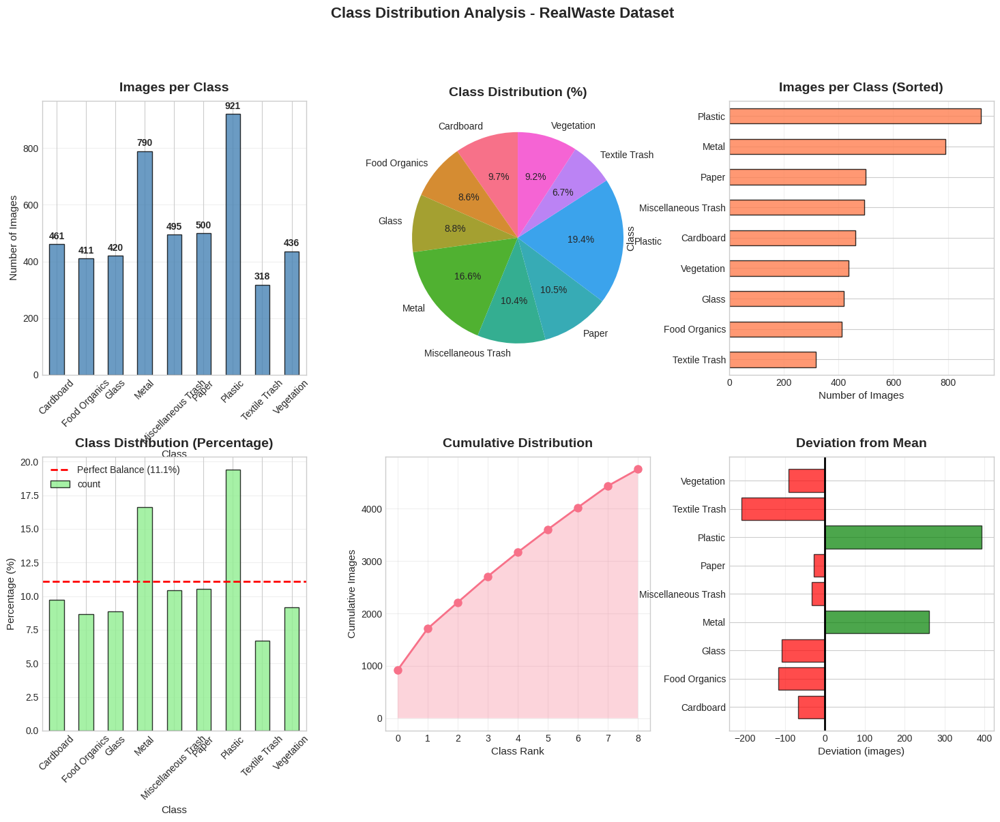

✅ Visualization saved as 'class_distribution_analysis.png'


In [7]:
# Create comprehensive class distribution visualizations
fig = plt.figure(figsize=(18, 12))
gs = GridSpec(2, 3, figure=fig, hspace=0.3, wspace=0.3)

# 1. Bar chart
ax1 = fig.add_subplot(gs[0, 0])
class_counts.plot(kind='bar', ax=ax1, color='steelblue', edgecolor='black', alpha=0.8)
ax1.set_title('Images per Class', fontsize=14, fontweight='bold', pad=10)
ax1.set_xlabel('Class', fontsize=11)
ax1.set_ylabel('Number of Images', fontsize=11)
ax1.tick_params(axis='x', rotation=45)
ax1.grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, v in enumerate(class_counts):
    ax1.text(i, v + 10, str(v), ha='center', va='bottom', fontweight='bold')

# 2. Pie chart
ax2 = fig.add_subplot(gs[0, 1])
colors = sns.color_palette("husl", len(class_counts))
ax2.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', 
        startangle=90, colors=colors)
ax2.set_title('Class Distribution (%)', fontsize=14, fontweight='bold', pad=10)

# 3. Horizontal bar (sorted)
ax3 = fig.add_subplot(gs[0, 2])
class_counts.sort_values().plot(kind='barh', ax=ax3, color='coral', edgecolor='black', alpha=0.8)
ax3.set_title('Images per Class (Sorted)', fontsize=14, fontweight='bold', pad=10)
ax3.set_xlabel('Number of Images', fontsize=11)
ax3.set_ylabel('Class', fontsize=11)
ax3.grid(axis='x', alpha=0.3)

# 4. Percentage distribution
ax4 = fig.add_subplot(gs[1, 0])
class_percentages = (class_counts / len(df) * 100)
class_percentages.plot(kind='bar', ax=ax4, color='lightgreen', edgecolor='black', alpha=0.8)
ax4.set_title('Class Distribution (Percentage)', fontsize=14, fontweight='bold', pad=10)
ax4.set_xlabel('Class', fontsize=11)
ax4.set_ylabel('Percentage (%)', fontsize=11)
ax4.tick_params(axis='x', rotation=45)
ax4.grid(axis='y', alpha=0.3)
ax4.axhline(y=100/len(class_counts), color='red', linestyle='--', 
            linewidth=2, label=f'Perfect Balance ({100/len(class_counts):.1f}%)')
ax4.legend()

# 5. Cumulative distribution
ax5 = fig.add_subplot(gs[1, 1])
cumulative = class_counts.sort_values(ascending=False).cumsum()
ax5.plot(range(len(cumulative)), cumulative, marker='o', linewidth=2, markersize=8)
ax5.fill_between(range(len(cumulative)), cumulative, alpha=0.3)
ax5.set_title('Cumulative Distribution', fontsize=14, fontweight='bold', pad=10)
ax5.set_xlabel('Class Rank', fontsize=11)
ax5.set_ylabel('Cumulative Images', fontsize=11)
ax5.grid(alpha=0.3)

# 6. Deviation from mean
ax6 = fig.add_subplot(gs[1, 2])
deviation = class_counts - class_counts.mean()
colors_dev = ['red' if x < 0 else 'green' for x in deviation]
ax6.barh(range(len(deviation)), deviation, color=colors_dev, alpha=0.7, edgecolor='black')
ax6.set_yticks(range(len(deviation)))
ax6.set_yticklabels(deviation.index)
ax6.set_title('Deviation from Mean', fontsize=14, fontweight='bold', pad=10)
ax6.set_xlabel('Deviation (images)', fontsize=11)
ax6.axvline(x=0, color='black', linewidth=2)
ax6.grid(axis='x', alpha=0.3)

plt.suptitle('Class Distribution Analysis - RealWaste Dataset', 
             fontsize=16, fontweight='bold', y=0.995)
plt.savefig('class_distribution_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Visualization saved as 'class_distribution_analysis.png'")

### Image Dimension Analysis

Analyze the distribution of image widths and heights in the RealWaste dataset to check for uniformity and identify outliers.
To decide a consistent target image size for preprocessing.

In [8]:
print("=" * 80)
print("IMAGE DIMENSIONS ANALYSIS")
print("=" * 80)

print("\n📏 Width Statistics:")
print(f"  • Minimum: {df['width'].min()} px")
print(f"  • Maximum: {df['width'].max()} px")
print(f"  • Mean: {df['width'].mean():.2f} px")
print(f"  • Median: {df['width'].median()} px")
print(f"  • Std Dev: {df['width'].std():.2f} px")

print("\n📏 Height Statistics:")
print(f"  • Minimum: {df['height'].min()} px")
print(f"  • Maximum: {df['height'].max()} px")
print(f"  • Mean: {df['height'].mean():.2f} px")
print(f"  • Median: {df['height'].median()} px")
print(f"  • Std Dev: {df['height'].std():.2f} px")

print("\n📐 Aspect Ratio Statistics:")
print(f"  • Minimum: {df['aspect_ratio'].min():.3f}")
print(f"  • Maximum: {df['aspect_ratio'].max():.3f}")
print(f"  • Mean: {df['aspect_ratio'].mean():.3f}")
print(f"  • Median: {df['aspect_ratio'].median():.3f}")

# Check dimension uniformity
unique_dimensions = df.groupby(['width', 'height']).size()
print(f"\n🔍 Dimension Uniformity:")
print(f"  • Unique dimension combinations: {len(unique_dimensions)}")

if len(unique_dimensions) == 1:
    dim = unique_dimensions.index[0]
    print(f"  ✅ All images have UNIFORM dimensions: {dim[0]}x{dim[1]}")
else:
    print(f"  ⚠️  Images have VARYING dimensions")
    print(f"\n  Top 5 Most Common Dimensions:")
    for (w, h), count in unique_dimensions.nlargest(5).items():
        print(f"    • {w}x{h}: {count} images ({count/len(df)*100:.1f}%)")

IMAGE DIMENSIONS ANALYSIS

📏 Width Statistics:
  • Minimum: 524 px
  • Maximum: 524 px
  • Mean: 524.00 px
  • Median: 524.0 px
  • Std Dev: 0.00 px

📏 Height Statistics:
  • Minimum: 524 px
  • Maximum: 524 px
  • Mean: 524.00 px
  • Median: 524.0 px
  • Std Dev: 0.00 px

📐 Aspect Ratio Statistics:
  • Minimum: 1.000
  • Maximum: 1.000
  • Mean: 1.000
  • Median: 1.000

🔍 Dimension Uniformity:
  • Unique dimension combinations: 1
  ✅ All images have UNIFORM dimensions: 524x524


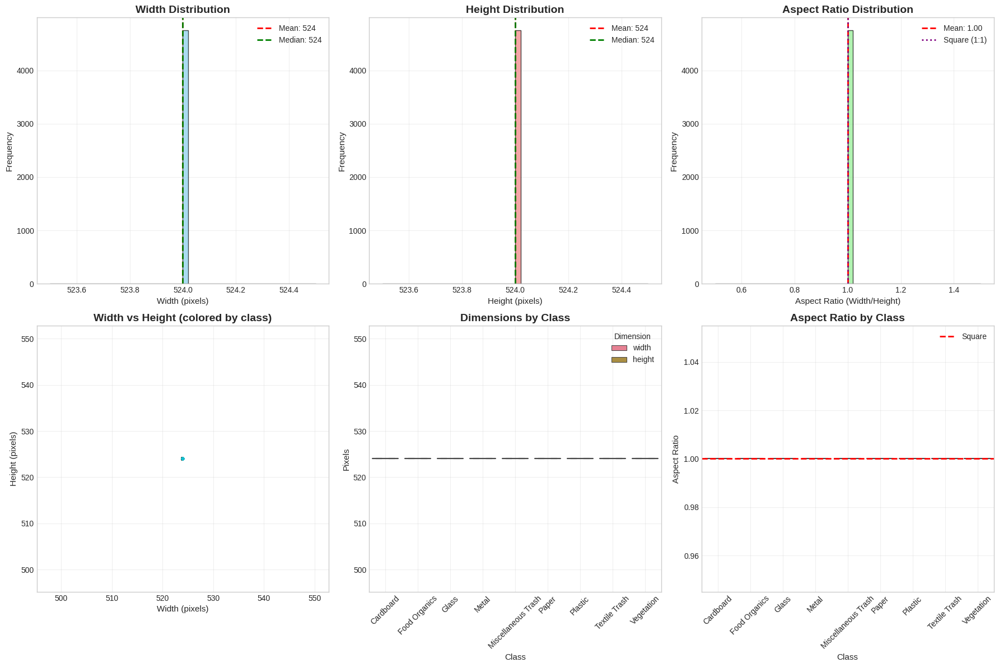

✅ Visualization saved as 'image_dimensions_analysis.png'


In [9]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 1. Width distribution
axes[0, 0].hist(df['width'], bins=50, color='skyblue', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(df['width'].mean(), color='red', linestyle='--', linewidth=2, 
                   label=f'Mean: {df["width"].mean():.0f}')
axes[0, 0].axvline(df['width'].median(), color='green', linestyle='--', linewidth=2, 
                   label=f'Median: {df["width"].median():.0f}')
axes[0, 0].set_title('Width Distribution', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Width (pixels)', fontsize=11)
axes[0, 0].set_ylabel('Frequency', fontsize=11)
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# 2. Height distribution
axes[0, 1].hist(df['height'], bins=50, color='lightcoral', edgecolor='black', alpha=0.7)
axes[0, 1].axvline(df['height'].mean(), color='red', linestyle='--', linewidth=2, 
                   label=f'Mean: {df["height"].mean():.0f}')
axes[0, 1].axvline(df['height'].median(), color='green', linestyle='--', linewidth=2, 
                   label=f'Median: {df["height"].median():.0f}')
axes[0, 1].set_title('Height Distribution', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Height (pixels)', fontsize=11)
axes[0, 1].set_ylabel('Frequency', fontsize=11)
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# 3. Aspect ratio distribution
axes[0, 2].hist(df['aspect_ratio'], bins=50, color='lightgreen', edgecolor='black', alpha=0.7)
axes[0, 2].axvline(df['aspect_ratio'].mean(), color='red', linestyle='--', linewidth=2, 
                   label=f'Mean: {df["aspect_ratio"].mean():.2f}')
axes[0, 2].axvline(1.0, color='purple', linestyle=':', linewidth=2, label='Square (1:1)')
axes[0, 2].set_title('Aspect Ratio Distribution', fontsize=14, fontweight='bold')
axes[0, 2].set_xlabel('Aspect Ratio (Width/Height)', fontsize=11)
axes[0, 2].set_ylabel('Frequency', fontsize=11)
axes[0, 2].legend()
axes[0, 2].grid(alpha=0.3)

# 4. Width vs Height scatter
scatter = axes[1, 0].scatter(df['width'], df['height'], 
                             c=pd.Categorical(df['class']).codes, 
                             cmap='tab10', alpha=0.5, s=10)
axes[1, 0].set_title('Width vs Height (colored by class)', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Width (pixels)', fontsize=11)
axes[1, 0].set_ylabel('Height (pixels)', fontsize=11)
axes[1, 0].grid(alpha=0.3)

# 5. Box plot - dimensions by class
df_melted = pd.melt(df, id_vars=['class'], value_vars=['width', 'height'], 
                    var_name='Dimension', value_name='Pixels')
sns.boxplot(data=df_melted, x='class', y='Pixels', hue='Dimension', ax=axes[1, 1])
axes[1, 1].set_title('Dimensions by Class', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Class', fontsize=11)
axes[1, 1].set_ylabel('Pixels', fontsize=11)
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(alpha=0.3)

# 6. Aspect ratio by class
sns.violinplot(data=df, x='class', y='aspect_ratio', ax=axes[1, 2])
axes[1, 2].axhline(y=1.0, color='red', linestyle='--', linewidth=2, label='Square')
axes[1, 2].set_title('Aspect Ratio by Class', fontsize=14, fontweight='bold')
axes[1, 2].set_xlabel('Class', fontsize=11)
axes[1, 2].set_ylabel('Aspect Ratio', fontsize=11)
axes[1, 2].tick_params(axis='x', rotation=45)
axes[1, 2].legend()
axes[1, 2].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('image_dimensions_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Visualization saved as 'image_dimensions_analysis.png'")

All images have uniform dimensions, no outliers. No need of reshaping.

### Pixel Intensity Analysis

Examine pixel intensity distribution across all images to understand brightness and contrast variations.
This helps decide if normalization or histogram equalization is needed.

In [10]:
print("=" * 80)
print("PIXEL INTENSITY ANALYSIS")
print("=" * 80)

print("\n🎨 Mean Intensity Statistics:")
print(f"  • Overall Mean: {df['mean_intensity'].mean():.2f}")
print(f"  • Std Dev: {df['mean_intensity'].std():.2f}")
print(f"  • Minimum: {df['mean_intensity'].min():.2f}")
print(f"  • Maximum: {df['mean_intensity'].max():.2f}")
print(f"  • Median: {df['mean_intensity'].median():.2f}")

print("\n📊 Intensity Variability (Std within images):")
print(f"  • Mean Std: {df['std_intensity'].mean():.2f}")
print(f"  • Std of Std: {df['std_intensity'].std():.2f}")
print(f"  • Minimum: {df['std_intensity'].min():.2f}")
print(f"  • Maximum: {df['std_intensity'].max():.2f}")

print("\n💡 Interpretation:")
mean_int = df['mean_intensity'].mean()
if mean_int < 85:
    print("  • Dataset is generally DARK")
    print("  → Consider brightness augmentation")
elif mean_int > 170:
    print("  • Dataset is generally BRIGHT")
    print("  → Consider exposure/contrast adjustments")
else:
    print("  ✅ Dataset has moderate brightness levels")

std_int = df['std_intensity'].mean()
if std_int < 30:
    print("  • Low contrast images (low variability)")
    print("  → Consider contrast enhancement")
elif std_int > 70:
    print("  • High contrast images (high variability)")
else:
    print("  ✅ Good contrast levels in images")

# Check for extreme cases
dark_images = df[df['mean_intensity'] < 50]
bright_images = df[df['mean_intensity'] > 200]

print(f"\n⚠️  Extreme Cases:")
print(f"  • Very dark images (mean < 50): {len(dark_images)} ({len(dark_images)/len(df)*100:.1f}%)")
print(f"  • Very bright images (mean > 200): {len(bright_images)} ({len(bright_images)/len(df)*100:.1f}%)")

PIXEL INTENSITY ANALYSIS

🎨 Mean Intensity Statistics:
  • Overall Mean: 157.14
  • Std Dev: 9.52
  • Minimum: 107.48
  • Maximum: 184.92
  • Median: 157.98

📊 Intensity Variability (Std within images):
  • Mean Std: 44.29
  • Std of Std: 12.09
  • Minimum: 17.77
  • Maximum: 91.75

💡 Interpretation:
  ✅ Dataset has moderate brightness levels
  ✅ Good contrast levels in images

⚠️  Extreme Cases:
  • Very dark images (mean < 50): 0 (0.0%)
  • Very bright images (mean > 200): 0 (0.0%)


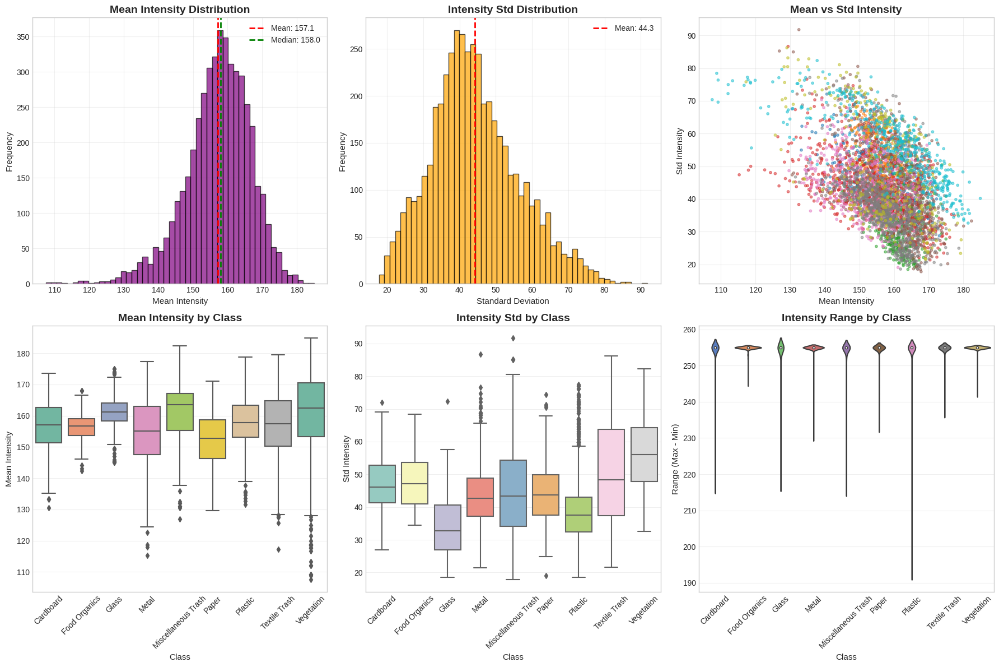

✅ Visualization saved as 'pixel_intensity_analysis.png'


In [11]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 1. Mean intensity distribution
axes[0, 0].hist(df['mean_intensity'], bins=50, color='purple', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(df['mean_intensity'].mean(), color='red', linestyle='--', linewidth=2,
                   label=f'Mean: {df["mean_intensity"].mean():.1f}')
axes[0, 0].axvline(df['mean_intensity'].median(), color='green', linestyle='--', linewidth=2,
                   label=f'Median: {df["mean_intensity"].median():.1f}')
axes[0, 0].set_title('Mean Intensity Distribution', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Mean Intensity', fontsize=11)
axes[0, 0].set_ylabel('Frequency', fontsize=11)
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# 2. Std intensity distribution
axes[0, 1].hist(df['std_intensity'], bins=50, color='orange', edgecolor='black', alpha=0.7)
axes[0, 1].axvline(df['std_intensity'].mean(), color='red', linestyle='--', linewidth=2,
                   label=f'Mean: {df["std_intensity"].mean():.1f}')
axes[0, 1].set_title('Intensity Std Distribution', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Standard Deviation', fontsize=11)
axes[0, 1].set_ylabel('Frequency', fontsize=11)
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# 3. Mean vs Std scatter
scatter = axes[0, 2].scatter(df['mean_intensity'], df['std_intensity'],
                             c=pd.Categorical(df['class']).codes,
                             cmap='tab10', alpha=0.5, s=10)
axes[0, 2].set_title('Mean vs Std Intensity', fontsize=14, fontweight='bold')
axes[0, 2].set_xlabel('Mean Intensity', fontsize=11)
axes[0, 2].set_ylabel('Std Intensity', fontsize=11)
axes[0, 2].grid(alpha=0.3)

# 4. Mean intensity by class
sns.boxplot(data=df, x='class', y='mean_intensity', ax=axes[1, 0], palette='Set2')
axes[1, 0].set_title('Mean Intensity by Class', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Class', fontsize=11)
axes[1, 0].set_ylabel('Mean Intensity', fontsize=11)
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(axis='y', alpha=0.3)

# 5. Std intensity by class
sns.boxplot(data=df, x='class', y='std_intensity', ax=axes[1, 1], palette='Set3')
axes[1, 1].set_title('Intensity Std by Class', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Class', fontsize=11)
axes[1, 1].set_ylabel('Std Intensity', fontsize=11)
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(axis='y', alpha=0.3)

# 6. Intensity range (min-max) by class
df['intensity_range'] = df['max_intensity'] - df['min_intensity']
sns.violinplot(data=df, x='class', y='intensity_range', ax=axes[1, 2], palette='muted')
axes[1, 2].set_title('Intensity Range by Class', fontsize=14, fontweight='bold')
axes[1, 2].set_xlabel('Class', fontsize=11)
axes[1, 2].set_ylabel('Range (Max - Min)', fontsize=11)
axes[1, 2].tick_params(axis='x', rotation=45)
axes[1, 2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('pixel_intensity_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Visualization saved as 'pixel_intensity_analysis.png'")

SAMPLE IMAGES FROM EACH CLASS

Displaying 4 random samples from each class...

1. Cardboard: 461 images
2. Food Organics: 411 images
3. Glass: 420 images
4. Metal: 790 images
5. Miscellaneous Trash: 495 images
6. Paper: 500 images
7. Plastic: 921 images
8. Textile Trash: 318 images
9. Vegetation: 436 images


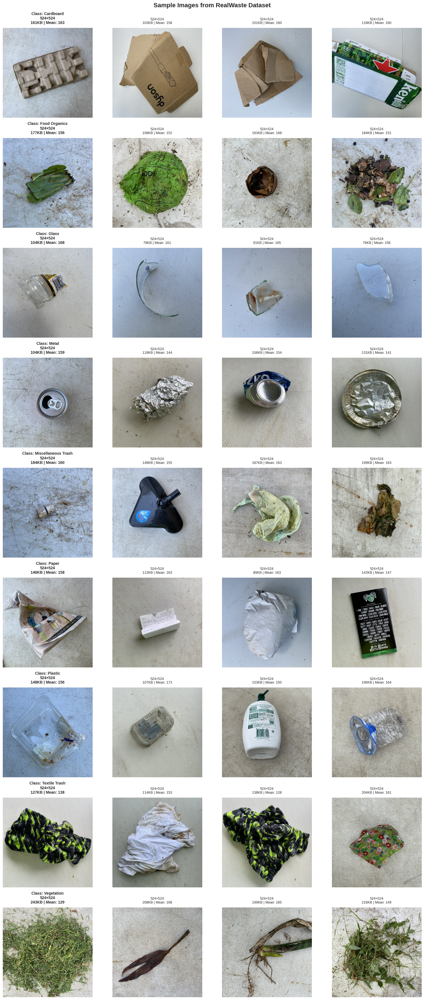


✅ Visualization saved as 'sample_images_grid.png'


In [12]:
print("=" * 80)
print("SAMPLE IMAGES FROM EACH CLASS")
print("=" * 80)

# Number of samples per class
samples_per_class = 4

# Create figure
n_classes = len(class_names)
fig, axes = plt.subplots(n_classes, samples_per_class, 
                         figsize=(samples_per_class * 4, n_classes * 4))

if n_classes == 1:
    axes = axes.reshape(1, -1)

print(f"\nDisplaying {samples_per_class} random samples from each class...\n")

for i, class_name in enumerate(class_names):
    # Get random samples from this class
    class_df = df[df['class'] == class_name]
    samples = class_df.sample(min(samples_per_class, len(class_df)))
    
    print(f"{i+1}. {class_name}: {len(class_df)} images")
    
    for j, (idx, row) in enumerate(samples.iterrows()):
        if j < samples_per_class:
            # Load and display image
            img = Image.open(row['path'])
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            
            # Add title with metadata
            title = f"{row['width']}×{row['height']}\n"
            title += f"{row['file_size_kb']:.0f}KB | "
            title += f"Mean: {row['mean_intensity']:.0f}"
            
            if j == 0:
                axes[i, j].set_title(f"Class: {class_name}\n{title}", 
                                    fontsize=10, fontweight='bold', pad=10)
            else:
                axes[i, j].set_title(title, fontsize=9, pad=10)

plt.suptitle('Sample Images from RealWaste Dataset', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('sample_images_grid.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Visualization saved as 'sample_images_grid.png'")

In [13]:
print("=" * 80)
print("RGB COLOR CHANNEL ANALYSIS")
print("=" * 80)

# Sample images for detailed RGB analysis
num_samples = 200
print(f"\nAnalyzing RGB channels from {num_samples} randomly sampled images...")
print("(This may take a moment...)")

sample_indices = np.random.choice(len(df), min(num_samples, len(df)), replace=False)
sampled_df = df.iloc[sample_indices]

# Storage for RGB statistics
rgb_data = {
    'red_mean': [],
    'green_mean': [],
    'blue_mean': [],
    'red_std': [],
    'green_std': [],
    'blue_std': [],
    'class': []
}

for idx, row in sampled_df.iterrows():
    try:
        img = cv2.imread(row['path'])
        if img is not None and len(img.shape) == 3:
            # Convert BGR to RGB
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Calculate channel statistics
            rgb_data['red_mean'].append(img_rgb[:, :, 0].mean())
            rgb_data['green_mean'].append(img_rgb[:, :, 1].mean())
            rgb_data['blue_mean'].append(img_rgb[:, :, 2].mean())
            rgb_data['red_std'].append(img_rgb[:, :, 0].std())
            rgb_data['green_std'].append(img_rgb[:, :, 1].std())
            rgb_data['blue_std'].append(img_rgb[:, :, 2].std())
            rgb_data['class'].append(row['class'])
    except Exception as e:
        continue

rgb_df = pd.DataFrame(rgb_data)

print(f"\n✅ Successfully analyzed {len(rgb_df)} images")

# Display statistics
print("\n🎨 RGB Channel Statistics:")
print("\nRED Channel:")
print(f"  • Mean: {rgb_df['red_mean'].mean():.2f} ± {rgb_df['red_mean'].std():.2f}")
print(f"  • Range: {rgb_df['red_mean'].min():.2f} - {rgb_df['red_mean'].max():.2f}")

print("\nGREEN Channel:")
print(f"  • Mean: {rgb_df['green_mean'].mean():.2f} ± {rgb_df['green_mean'].std():.2f}")
print(f"  • Range: {rgb_df['green_mean'].min():.2f} - {rgb_df['green_mean'].max():.2f}")

print("\nBLUE Channel:")
print(f"  • Mean: {rgb_df['blue_mean'].mean():.2f} ± {rgb_df['blue_mean'].std():.2f}")
print(f"  • Range: {rgb_df['blue_mean'].min():.2f} - {rgb_df['blue_mean'].max():.2f}")

# Dominant channel
avg_red = rgb_df['red_mean'].mean()
avg_green = rgb_df['green_mean'].mean()
avg_blue = rgb_df['blue_mean'].mean()

print("\n💡 Color Dominance:")
dominant = max([('RED', avg_red), ('GREEN', avg_green), ('BLUE', avg_blue)], key=lambda x: x[1])
print(f"  • Dominant channel: {dominant[0]} ({dominant[1]:.2f})")

if avg_red > avg_green and avg_red > avg_blue:
    print("  • Dataset has a warm/reddish tone")
elif avg_green > avg_red and avg_green > avg_blue:
    print("  • Dataset has a greenish tone")
elif avg_blue > avg_red and avg_blue > avg_green:
    print("  • Dataset has a cool/bluish tone")
else:
    print("  • Dataset has balanced color distribution")

RGB COLOR CHANNEL ANALYSIS

Analyzing RGB channels from 200 randomly sampled images...
(This may take a moment...)

✅ Successfully analyzed 200 images

🎨 RGB Channel Statistics:

RED Channel:
  • Mean: 152.03 ± 16.06
  • Range: 95.49 - 182.82

GREEN Channel:
  • Mean: 157.10 ± 10.51
  • Range: 128.15 - 178.56

BLUE Channel:
  • Mean: 159.96 ± 15.76
  • Range: 91.34 - 193.22

💡 Color Dominance:
  • Dominant channel: BLUE (159.96)
  • Dataset has a cool/bluish tone


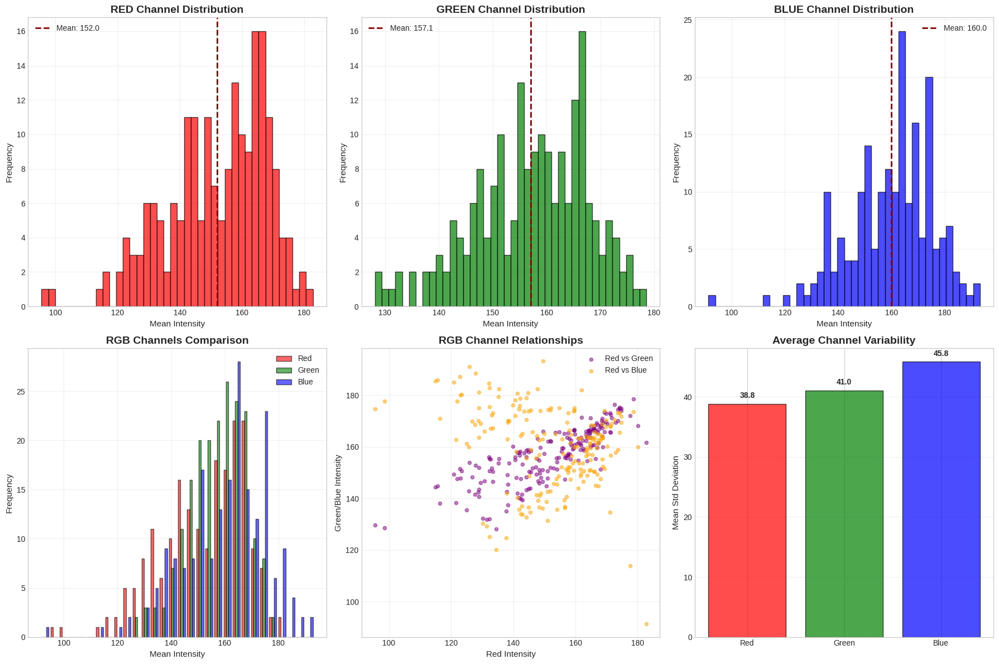

✅ Visualization saved as 'rgb_channel_analysis.png'


In [14]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# RGB channel distributions
channels = ['red', 'green', 'blue']
colors = ['red', 'green', 'blue']

for i, (channel, color) in enumerate(zip(channels, colors)):
    # Mean distribution
    axes[0, i].hist(rgb_df[f'{channel}_mean'], bins=40, color=color, 
                   alpha=0.7, edgecolor='black')
    axes[0, i].axvline(rgb_df[f'{channel}_mean'].mean(), color='darkred', 
                      linestyle='--', linewidth=2,
                      label=f'Mean: {rgb_df[f"{channel}_mean"].mean():.1f}')
    axes[0, i].set_title(f'{channel.upper()} Channel Distribution', 
                        fontsize=14, fontweight='bold')
    axes[0, i].set_xlabel('Mean Intensity', fontsize=11)
    axes[0, i].set_ylabel('Frequency', fontsize=11)
    axes[0, i].legend()
    axes[0, i].grid(alpha=0.3)

# RGB comparison
axes[1, 0].hist([rgb_df['red_mean'], rgb_df['green_mean'], rgb_df['blue_mean']], 
               bins=30, label=['Red', 'Green', 'Blue'], 
               color=['red', 'green', 'blue'], alpha=0.6, edgecolor='black')
axes[1, 0].set_title('RGB Channels Comparison', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Mean Intensity', fontsize=11)
axes[1, 0].set_ylabel('Frequency', fontsize=11)
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# RGB scatter plot
axes[1, 1].scatter(rgb_df['red_mean'], rgb_df['green_mean'], 
                  c='purple', alpha=0.5, s=20, label='Red vs Green')
axes[1, 1].scatter(rgb_df['red_mean'], rgb_df['blue_mean'], 
                  c='orange', alpha=0.5, s=20, label='Red vs Blue')
axes[1, 1].set_title('RGB Channel Relationships', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Red Intensity', fontsize=11)
axes[1, 1].set_ylabel('Green/Blue Intensity', fontsize=11)
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

# Channel standard deviations
channel_stds = [rgb_df['red_std'].mean(), 
                rgb_df['green_std'].mean(), 
                rgb_df['blue_std'].mean()]
axes[1, 2].bar(['Red', 'Green', 'Blue'], channel_stds, 
              color=['red', 'green', 'blue'], alpha=0.7, edgecolor='black')
axes[1, 2].set_title('Average Channel Variability', fontsize=14, fontweight='bold')
axes[1, 2].set_ylabel('Mean Std Deviation', fontsize=11)
axes[1, 2].grid(axis='y', alpha=0.3)

for i, v in enumerate(channel_stds):
    axes[1, 2].text(i, v + 1, f'{v:.1f}', ha='center', fontweight='bold')

plt.tight_layout()
plt.savefig('rgb_channel_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Visualization saved as 'rgb_channel_analysis.png'")

In [15]:
print("=" * 80)
print("FEATURE CORRELATION ANALYSIS")
print("=" * 80)

# Select numerical features for correlation
numerical_features = ['width', 'height', 'aspect_ratio', 'file_size_kb',
                     'mean_intensity', 'std_intensity', 'total_pixels']

# Calculate correlation matrix
correlation_matrix = df[numerical_features].corr()

print("\n📊 Correlation Matrix:")
display(correlation_matrix.round(3))

# Find strong correlations
print("\n🔍 Strong Correlations (|r| > 0.7):")
strong_corr = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        if abs(corr_value) > 0.7:
            feature1 = correlation_matrix.columns[i]
            feature2 = correlation_matrix.columns[j]
            strong_corr.append((feature1, feature2, corr_value))
            print(f"  • {feature1} ↔ {feature2}: {corr_value:.3f}")

if not strong_corr:
    print("  • No strong correlations found")

# Visualize correlation matrix
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0,
           square=True, linewidths=1, cbar_kws={"shrink": 0.8},
           fmt='.2f', ax=axes[0])
axes[0].set_title('Feature Correlation Heatmap', fontsize=14, fontweight='bold', pad=10)

# Correlation with file size (example)
correlations_with_size = correlation_matrix['file_size_kb'].sort_values(ascending=False)
correlations_with_size = correlations_with_size[correlations_with_size.index != 'file_size_kb']
axes[1].barh(range(len(correlations_with_size)), correlations_with_size.values, 
            color=['green' if x > 0 else 'red' for x in correlations_with_size.values],
            alpha=0.7, edgecolor='black')
axes[1].set_yticks(range(len(correlations_with_size)))
axes[1].set_yticklabels(correlations_with_size.index)
axes[1].set_title('Correlation with File Size', fontsize=14, fontweight='bold', pad=10)
axes[1].set_xlabel('Correlation Coefficient', fontsize=11)
axes[1].axvline(x=0, color='black', linewidth=2)
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig('correlation_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Visualization saved as 'correlation_analysis.png'")

FEATURE CORRELATION ANALYSIS


KeyError: "['total_pixels'] not in index"

In [ ]:
print("=" * 80)
print("CLASS-WISE DETAILED ANALYSIS")
print("=" * 80)

# Analyze each class individually
class_summary = []

for class_name in class_names:
    class_df = df[df['class'] == class_name]
    
    summary = {
        'Class': class_name,
        'Count': len(class_df),
        'Percentage': len(class_df) / len(df) * 100,
        'Mean Width': class_df['width'].mean(),
        'Mean Height': class_df['height'].mean(),
        'Mean Aspect Ratio': class_df['aspect_ratio'].mean(),
        'Mean Intensity': class_df['mean_intensity'].mean(),
        'Mean Std Intensity': class_df['std_intensity'].mean(),
        'Mean File Size (KB)': class_df['file_size_kb'].mean()
    }
    
    class_summary.append(summary)

class_summary_df = pd.DataFrame(class_summary)

print("\n📊 Class Summary Statistics:")
display(class_summary_df.round(2))

# Visualize class-wise comparison
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Mean dimensions by class
x = np.arange(len(class_names))
width = 0.35
axes[0, 0].bar(x - width/2, class_summary_df['Mean Width'], width, 
              label='Width', alpha=0.8, color='steelblue', edgecolor='black')
axes[0, 0].bar(x + width/2, class_summary_df['Mean Height'], width,
              label='Height', alpha=0.8, color='coral', edgecolor='black')
axes[0, 0].set_title('Average Dimensions by Class', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Class', fontsize=11)
axes[0, 0].set_ylabel('Pixels', fontsize=11)
axes[0, 0].set_xticks(x)
axes[0, 0].set_xticklabels(class_names, rotation=45, ha='right')
axes[0, 0].legend()
axes[0, 0].grid(axis='y', alpha=0.3)

# 2. Mean intensity by class
axes[0, 1].bar(class_names, class_summary_df['Mean Intensity'], 
              alpha=0.8, color='purple', edgecolor='black')
axes[0, 1].set_title('Average Intensity by Class', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Class', fontsize=11)
axes[0, 1].set_ylabel('Mean Intensity', fontsize=11)
axes[0, 1].tick_params(axis='x', rotation=45)
axes[0, 1].grid(axis='y', alpha=0.3)

# 3. File size by class
axes[1, 0].bar(class_names, class_summary_df['Mean File Size (KB)'],
              alpha=0.8, color='teal', edgecolor='black')
axes[1, 0].set_title('Average File Size by Class', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Class', fontsize=11)
axes[1, 0].set_ylabel('File Size (KB)', fontsize=11)
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(axis='y', alpha=0.3)

# 4. Aspect ratio by class
axes[1, 1].bar(class_names, class_summary_df['Mean Aspect Ratio'],
              alpha=0.8, color='orange', edgecolor='black')
axes[1, 1].axhline(y=1.0, color='red', linestyle='--', linewidth=2, label='Square (1:1)')
axes[1, 1].set_title('Average Aspect Ratio by Class', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Class', fontsize=11)
axes[1, 1].set_ylabel('Aspect Ratio', fontsize=11)
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].legend()
axes[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('class_wise_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Visualization saved as 'class_wise_analysis.png'")

In [ ]:
print("=" * 80)
print("DATA QUALITY ASSESSMENT")
print("=" * 80)

quality_issues = []

# 1. Check for missing values
print("\n1️⃣ Missing Values Check:")
missing = df.isnull().sum()
if missing.sum() > 0:
    print("  ❌ Missing values detected:")
    print(missing[missing > 0])
    quality_issues.append("Missing values")
else:
    print("  ✅ No missing values")

# 2. Check for duplicate paths
print("\n2️⃣ Duplicate Files Check:")
duplicates = df.duplicated(subset=['path']).sum()
if duplicates > 0:
    print(f"  ❌ {duplicates} duplicate file paths found")
    quality_issues.append(f"{duplicates} duplicates")
else:
    print("  ✅ No duplicate file paths")

# 3. Check for very small images
print("\n3️⃣ Image Size Check:")
small_threshold = 64  # pixels
small_images = df[(df['width'] < small_threshold) | (df['height'] < small_threshold)]
if len(small_images) > 0:
    print(f"  ⚠️  {len(small_images)} images smaller than {small_threshold}x{small_threshold} pixels")
    print(f"     ({len(small_images)/len(df)*100:.2f}% of dataset)")
    quality_issues.append(f"{len(small_images)} very small images")
else:
    print(f"  ✅ No images smaller than {small_threshold}x{small_threshold} pixels")

# 4. Check for extreme aspect ratios
print("\n4️⃣ Aspect Ratio Check:")
extreme_aspect = df[(df['aspect_ratio'] < 0.3) | (df['aspect_ratio'] > 3.0)]
if len(extreme_aspect) > 0:
    print(f"  ⚠️  {len(extreme_aspect)} images with extreme aspect ratios")
    print(f"     ({len(extreme_aspect)/len(df)*100:.2f}% of dataset)")
    print(f"     Range: {extreme_aspect['aspect_ratio'].min():.2f} to {extreme_aspect['aspect_ratio'].max():.2f}")
    quality_issues.append(f"{len(extreme_aspect)} extreme aspect ratios")
else:
    print("  ✅ All aspect ratios are reasonable (0.3 - 3.0)")

# 5. Check image modes
print("\n5️⃣ Image Mode Check:")
mode_counts = df['mode'].value_counts()
print("  Color modes found:")
for mode, count in mode_counts.items():
    print(f"    • {mode}: {count} images ({count/len(df)*100:.1f}%)")

unusual_modes = df[~df['mode'].isin(['RGB', 'L', 'RGBA'])]
if len(unusual_modes) > 0:
    print(f"  ⚠️  {len(unusual_modes)} images with unusual color modes")
    quality_issues.append(f"{len(unusual_modes)} unusual color modes")
else:
    print("  ✅ All images have standard color modes")

# 6. Check for corrupted/unreadable images
print("\n6️⃣ Readability Check:")
unreadable = []
for idx, row in df.sample(min(100, len(df))).iterrows():
    try:
        img = Image.open(row['path'])
        img.verify()
    except:
        unreadable.append(row['path'])

if len(unreadable) > 0:
    print(f"  ❌ {len(unreadable)} potentially corrupted images found in sample")
    quality_issues.append("Potentially corrupted images")
else:
    print("  ✅ All sampled images are readable")

# 7. Check brightness extremes
print("\n7️⃣ Brightness Extremes:")
very_dark = df[df['mean_intensity'] < 30]
very_bright = df[df['mean_intensity'] > 225]
print(f"  • Very dark images (mean < 30): {len(very_dark)} ({len(very_dark)/len(df)*100:.1f}%)")
print(f"  • Very bright images (mean > 225): {len(very_bright)} ({len(very_bright)/len(df)*100:.1f}%)")

if len(very_dark) > len(df) * 0.05:
    quality_issues.append(f"{len(very_dark)} very dark images")
if len(very_bright) > len(df) * 0.05:
    quality_issues.append(f"{len(very_bright)} very bright images")

# Summary
print("\n" + "=" * 80)
print("QUALITY ASSESSMENT SUMMARY")
print("=" * 80)

if len(quality_issues) == 0:
    print("\n✅ EXCELLENT: No significant data quality issues detected!")
    print("   Dataset is ready for CNN training.")
else:
    print(f"\n⚠️  Found {len(quality_issues)} potential quality issue(s):")
    for i, issue in enumerate(quality_issues, 1):
        print(f"   {i}. {issue}")
    print("\n   Recommendation: Review and address these issues before training.")